# Initial processing of SVZ MERFISH dataset 

This notebook contains code for initial processing and clustering of the SVZ MERFISH dataset (provided as AnnData). Using the MERFISH markers, we are unable to resolve the identity of non-ependymal ambiguous clusters colocalized to the lateral ventricles.

The raw MERFISH data can be retrieved from the Zenodo repository in our manuscript (DOI: 10.5281/zenodo.8259942). The repository also contain the TISSUE-formatted processed data directories that include outputs of this notebook and are inputs for associated analyses.

NOTE: The initial processing in this notebook uses a slightly different version of Squidpy than the TISSUE package (1.1.2 instead of 1.2.3) and has some resulting differences in dependencies. Please refer to the `environment_merfish.yml` file for dependencies for this notebook.

In [1]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import anndata as ad
import os
from scipy.stats import pearsonr

## Create AnnData for young SVZ regions

In [2]:
# Values for rectangular cropping around subventricular zone
# Determined manually and verified by domain experts
min_volume = 100
max_volume = 2000
min_count = 20
min_genes = 5

x_range1 = [-1200,-600]
x_range2 = [400,1000]
y_range = [-1300,500]

In [3]:
# Loading and initial processing of data from raw files
datafiles = ['MsBrain_VS38_Young-5_QC_VA79GMblock_V3_BW_4-5-2022/region_0',
             'MsBrain_VS38_Young-5_QC_VA79GMblock_V3_BW_4-5-2022/region_1']

age = [3, 3]


for i, direct in enumerate(datafiles):
    path = 'svz_merfish_data/'+direct
    
    ### Read in data
    
    # read cell by gene matrix
    cell_by_gene = pd.read_csv(path+"/cell_by_gene.csv", index_col=0)
    cells = cell_by_gene.index.tolist()
    # drop blank genes
    keep_genes = [x for x in cell_by_gene.columns.tolist() if 'Blank' not in x]
    cell_by_gene = cell_by_gene[keep_genes]
    # update index
    cell_by_gene.index = range(len(cell_by_gene.index.tolist()))
    # load in metadata
    meta_cell = pd.read_csv(path+"/cell_metadata.csv", index_col=0)
    meta_cell = meta_cell.loc[cells]
    meta_cell.index = range(len(meta_cell.index.tolist()))
    # add barcode count to metadata
    meta_cell['barcodeCount'] = cell_by_gene.sum(axis=1)
    # zero-center coordinates
    meta_cell.center_x = meta_cell.center_x-np.mean(meta_cell.center_x)
    meta_cell.center_y = meta_cell.center_y-np.mean(meta_cell.center_y)
    # initialize meta_gene
    meta_gene = pd.DataFrame(index=cell_by_gene.columns.tolist())
    
    ### Filter cells 
    
    # compute number of detected genes
    num_detected_genes = np.count_nonzero(cell_by_gene, axis=1)
    
    # filter cells based on volume and transcript count
    select_cells = meta_cell[(meta_cell.volume > min_volume) & 
                             (meta_cell.barcodeCount > min_count) & 
                             (meta_cell.volume < max_volume) &
                             (num_detected_genes > min_genes)&#].index.tolist()
                             ( ((meta_cell.center_x>x_range1[0])&(meta_cell.center_x<x_range1[1])) | ((meta_cell.center_x>x_range2[0])&(meta_cell.center_x<x_range2[1])) ) &
                             (meta_cell.center_y > y_range[0]) &
                             (meta_cell.center_y < y_range[1])].index.tolist()    
    
    ### Make AnnData object
    
    adata0 = sc.AnnData(X=cell_by_gene.loc[select_cells].values, 
                        obs=meta_cell.loc[select_cells], var=meta_gene,
                        dtype=cell_by_gene.values.dtype)
    # add spatial coordinates
    coordinates = meta_cell.loc[select_cells][["center_x", "center_y"]]
    adata0.obsm["spatial"] = coordinates.to_numpy()
    # add age
    adata0.obs["age"] = age[i]
    # add replicate #
    adata0.obs["sample"] = str(i)
    
    if i == 0:
        adata = adata0
    else:
        adata = ad.concat([adata, adata0])

/home/edsun/anaconda3/envs/merfish/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/edsun/anaconda3/envs/merfish/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/edsun/anaconda3/envs/merfish/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Note that the obs_names not being unique is due to combining two sections together

## Normalize and save anndata

In [6]:
# Raw data
raw_adata = adata.copy()

# Normalization of data by volume
adata.X = adata.X/adata.obs['volume'][:,None]

# Remove top 2% and bottom 2% of total expression cells
top = np.percentile(adata.X.sum(axis=1), 98)
bottom = np.percentile(adata.X.sum(axis=1), 2)
# filter and save raw adata
raw_adata = raw_adata[(adata.X.sum(axis=1) < top) & (adata.X.sum(axis=1) > bottom)]
raw_adata.write_h5ad("svz_anndata/pilot_svz_cropped_raw.h5ad")
# filter main/processed
adata = adata[(adata.X.sum(axis=1) < top) & (adata.X.sum(axis=1) > bottom)]

# Normalize total to 250
sc.pp.normalize_total(adata, target_sum=250)

# Log transform
sc.pp.log1p(adata)

# Z-score (need to do)
sc.pp.scale(adata, max_value=10)

<ipython-input-6-8f96ccd2ec88>:5: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  adata.X = adata.X/adata.obs['volume'][:,None]
/home/edsun/anaconda3/envs/merfish/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/edsun/anaconda3/envs/merfish/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)
/home/edsun/anaconda3/envs/merfish/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/ho

In [7]:
# Normalized data
adata.write_h5ad("svz_anndata/pilot_svz_cropped_normalized.h5ad")

# Initial cell type clustering and annotation

In [8]:
# Clustering and UMAP
sc.tl.pca(adata)
sc.pp.neighbors(adata) # build graph from PCA that will be used for UMAP and Leiden clustering
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters", resolution=0.5)

/home/edsun/anaconda3/envs/merfish/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


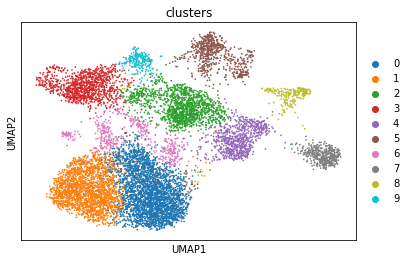

In [9]:
### Plotting
sc.pl.umap(adata, color="clusters")

### Annotate clusters with heatmaps of cell type markers

In [10]:
aNSC_markers = ["Hmgb2", "Hmgn2", "Ccnd2", "Sox2"]
Astrocyte_qNSC_markers = ["Aldoc", "Clu", "Mt3", "Gfap", "Id4"]
Neuroblast_markers = ["Tubb2b", "Sox4", "Tubb3", "Dcx"]
Microglia_markers = ["C1qa", "C1qb", "Hexb"]
Endothelial_markers = ["Cldn5", "Ly6c1", "Bsg"]
Oligo_markers = ["Plp1", "Mbp", "Ptgds"]
T_cell_markers = ["Cd3e", "Cd8a", "Nkg7"]
Mural_markers = ["Vtn", "Acta2"]
Ependymal_markers = ["Rarres2", "Tmem212"]
Neuron_markers = ["Ttr", "Rbp1", "Calml4"]
Macrophage_markers = ["H2-Aa", "Cd74", "Mrc1"]
Reactive_astrocyte_markers = ["S100b", "Ctnnb1"]

all_markers = aNSC_markers+Astrocyte_qNSC_markers+Neuroblast_markers+Microglia_markers+Endothelial_markers+Oligo_markers+T_cell_markers+Mural_markers+Ependymal_markers+Neuron_markers+Macrophage_markers+Reactive_astrocyte_markers

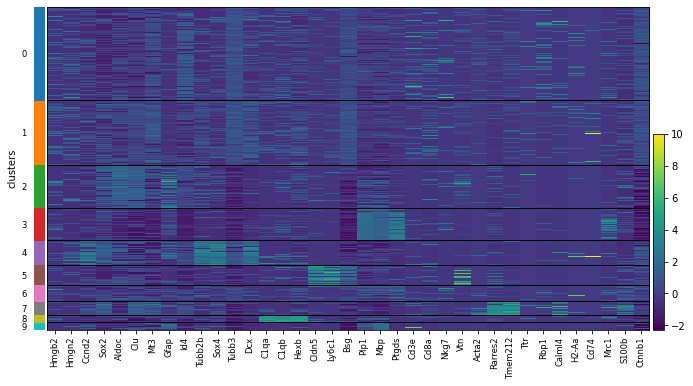

In [11]:
axs = sc.pl.heatmap(adata, all_markers, groupby='clusters', var_group_labels=all_markers)

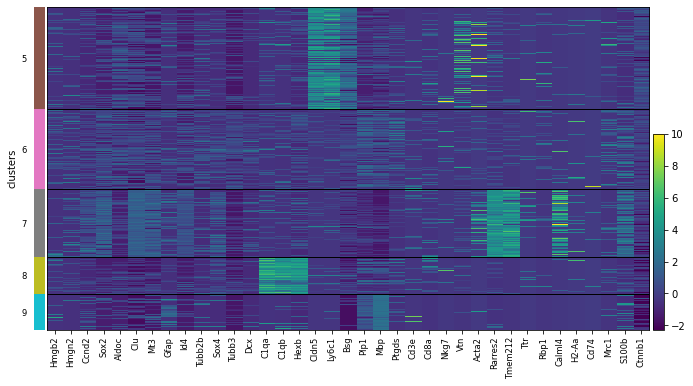

In [12]:
axs = sc.pl.heatmap(adata[adata.obs["clusters"].astype("float") > 4], all_markers, groupby='clusters', var_group_labels=all_markers)

### Map cell type identities

In [13]:
# manual annotation 
label_dict = {"0":"Neuron",
              "1":"Neuron",
              "2":"Astrocyte",
              "3":"Oligodendrocyte",
              "4":"Ambiguous",
              "5":"Endothelial",
              "6":"Neuron",
              "7":"Ependymal",
              "8":"Microglia",
              "9":"OPC",}

adata.obs["celltype"] = adata.obs["clusters"].replace(label_dict)

In [26]:
# reset category orders
adata.obs["celltype"] = adata.obs["celltype"].astype(str).astype('category')

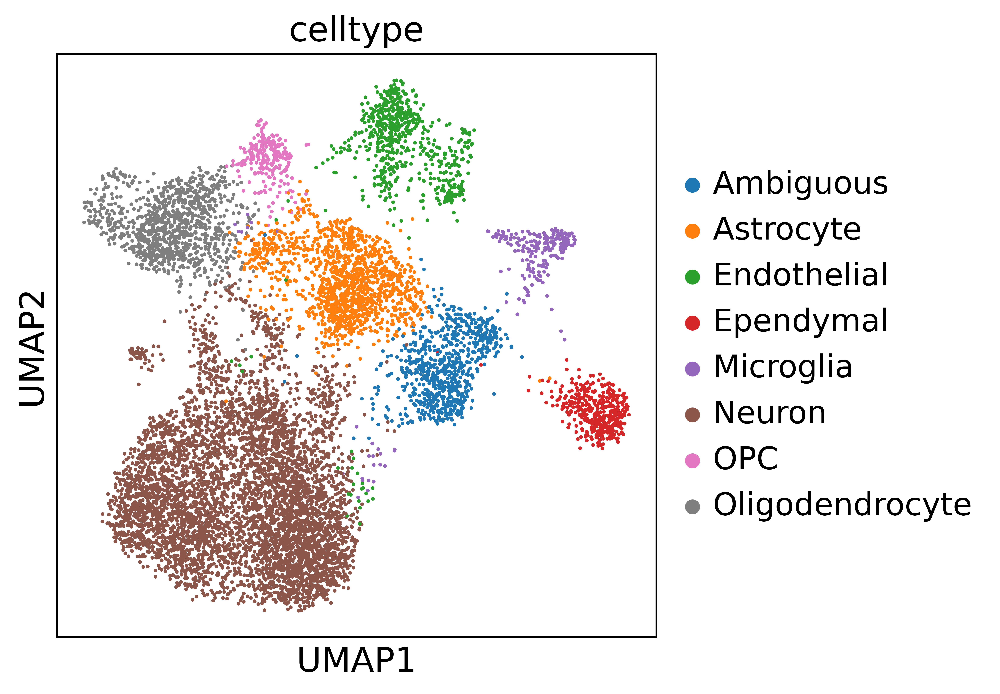

In [27]:
sc.pl.umap(adata, color='celltype')

In [28]:
# Make labeled heatmap plot
sc.set_figure_params(vector_friendly=True, dpi=500, figsize=(5,5), fontsize=16)
sc.pl.heatmap(adata, all_markers, groupby='celltype', var_group_labels=all_markers, show=False)
plt.savefig("plots/SVZ/initial_heatmap_ambiguous.pdf", bbox_inches="tight", dpi=300)

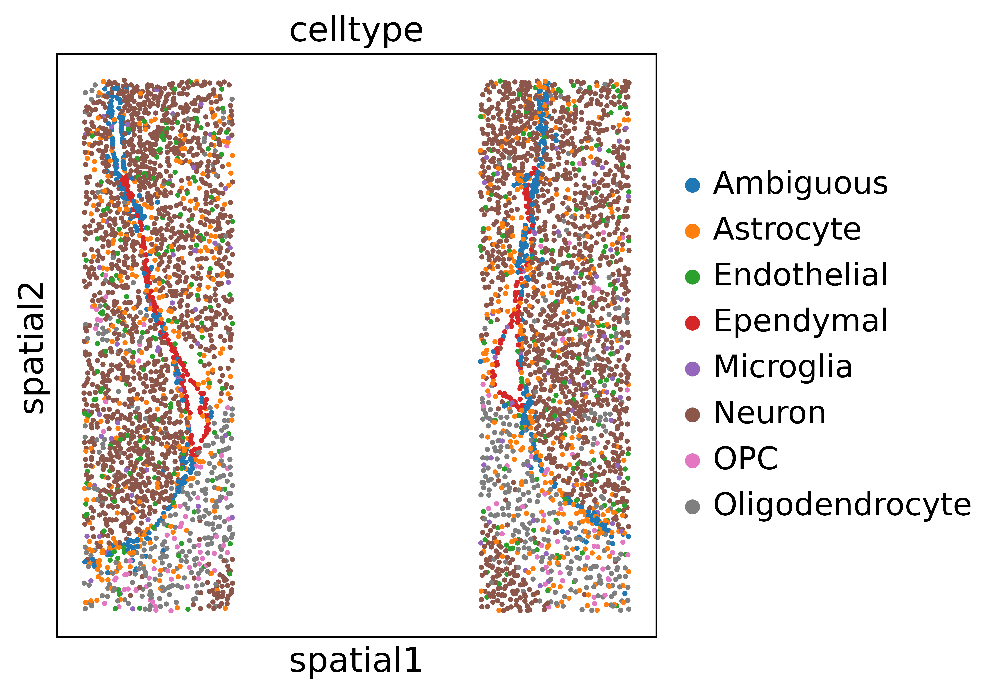

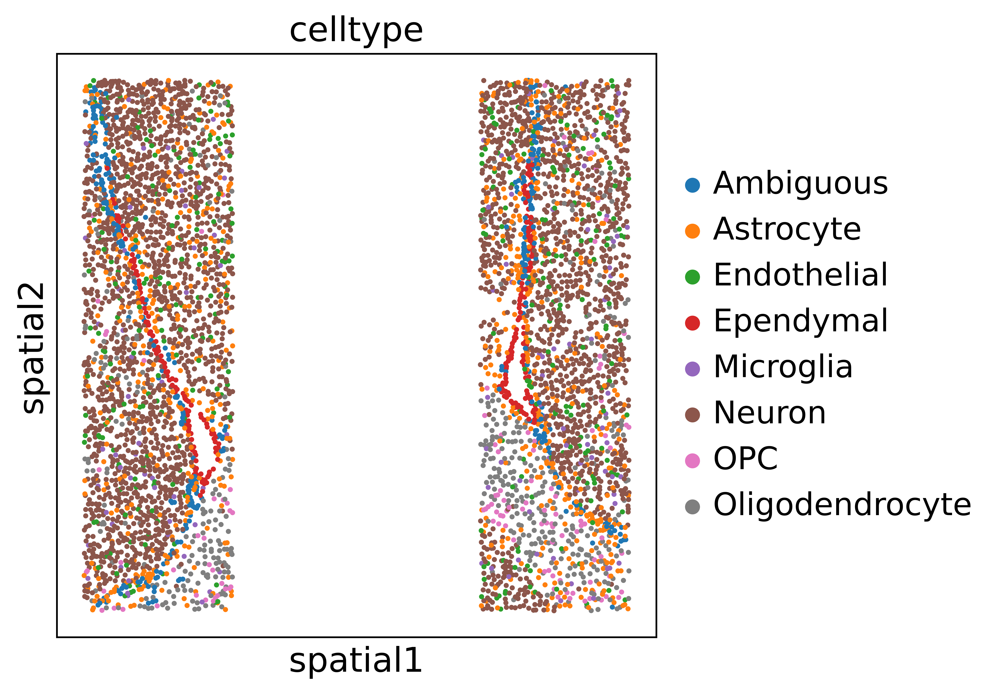

In [29]:
for sample in np.unique(adata.obs['sample']):
    sc.pl.embedding(adata[adata.obs['sample']==sample],
                    'spatial', color="celltype")

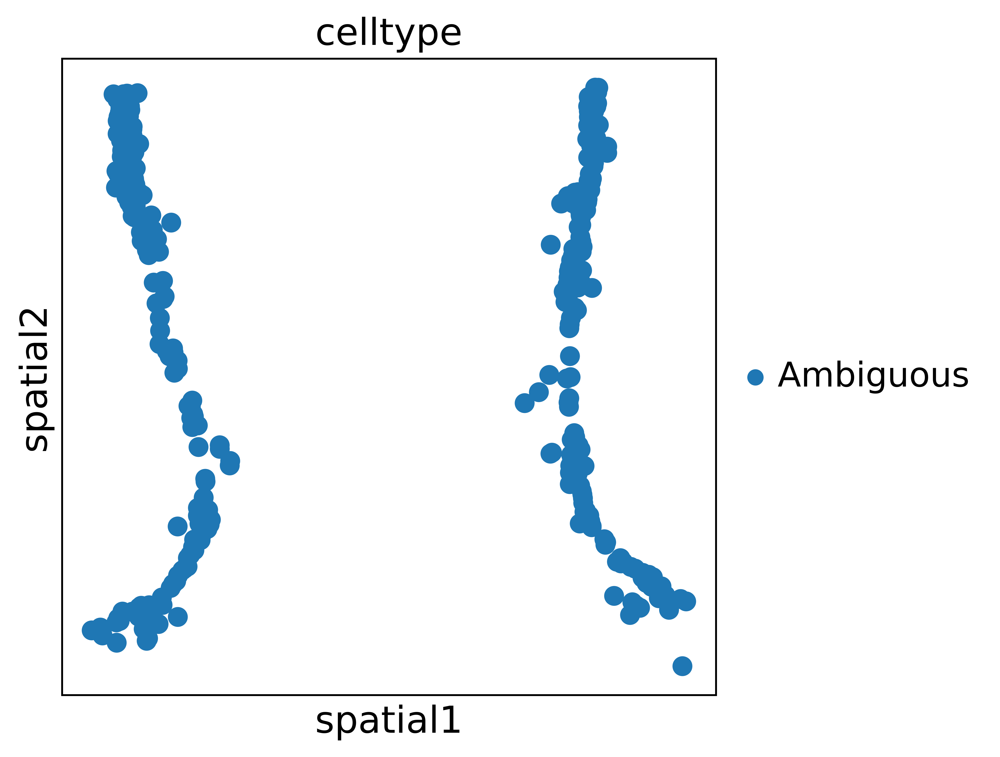

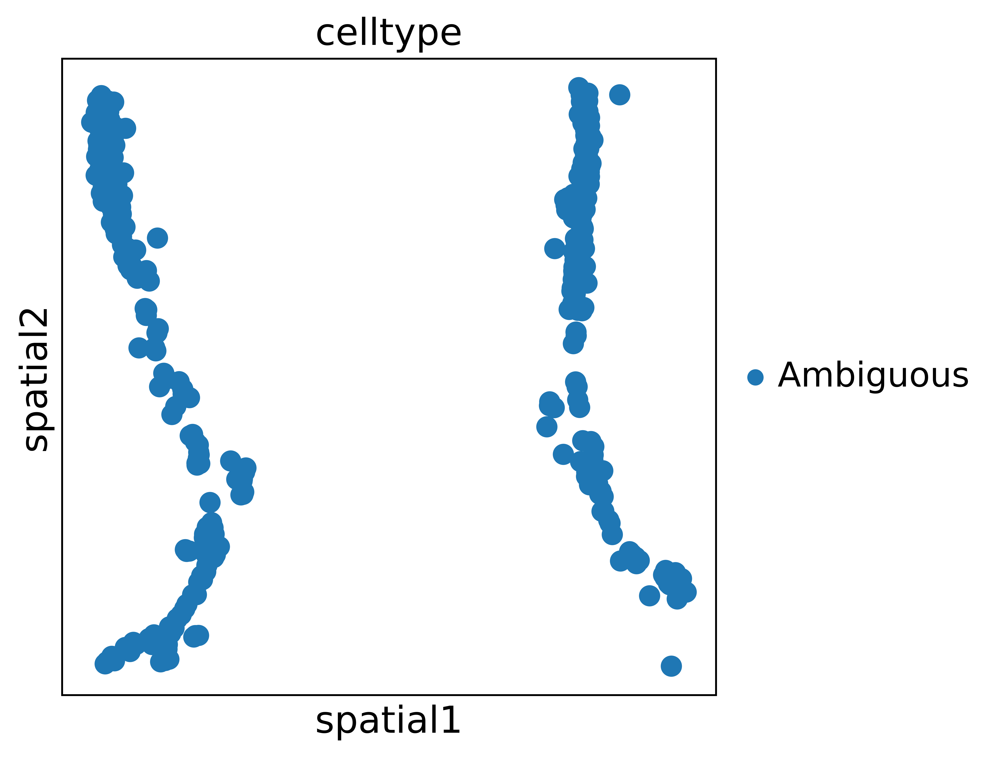

In [30]:
# Plotting the ambiguous cell cluster
sub_adata = adata[adata.obs['celltype'].isin(['Ambiguous'])]

for sample in np.unique(sub_adata.obs['sample']):
    sc.pl.embedding(sub_adata[sub_adata.obs['sample']==sample],
                    'spatial', color="celltype")

### Subclustering of Ambiguous cluster

In [31]:
def recluster_subset(sub_adata, resolution=0.1, n_pcs=20, n_neighbors=15):
    '''
    Runs clustering (pca -> neighbors -> leiden + umap) on sub_adata
    '''
    sc.tl.pca(sub_adata)
    sc.pp.neighbors(sub_adata, n_pcs=n_pcs, n_neighbors=n_neighbors)
    sc.tl.umap(sub_adata)
    sc.tl.leiden(sub_adata, key_added="leiden", resolution=resolution)

In [32]:
celltype_fineres = adata.obs["celltype"].values.astype(str)

In [33]:
celltype_to_subcluster='Ambiguous'
sub_adata = adata[adata.obs['celltype']==celltype_to_subcluster]

In [34]:
recluster_subset(sub_adata, resolution=0.5)

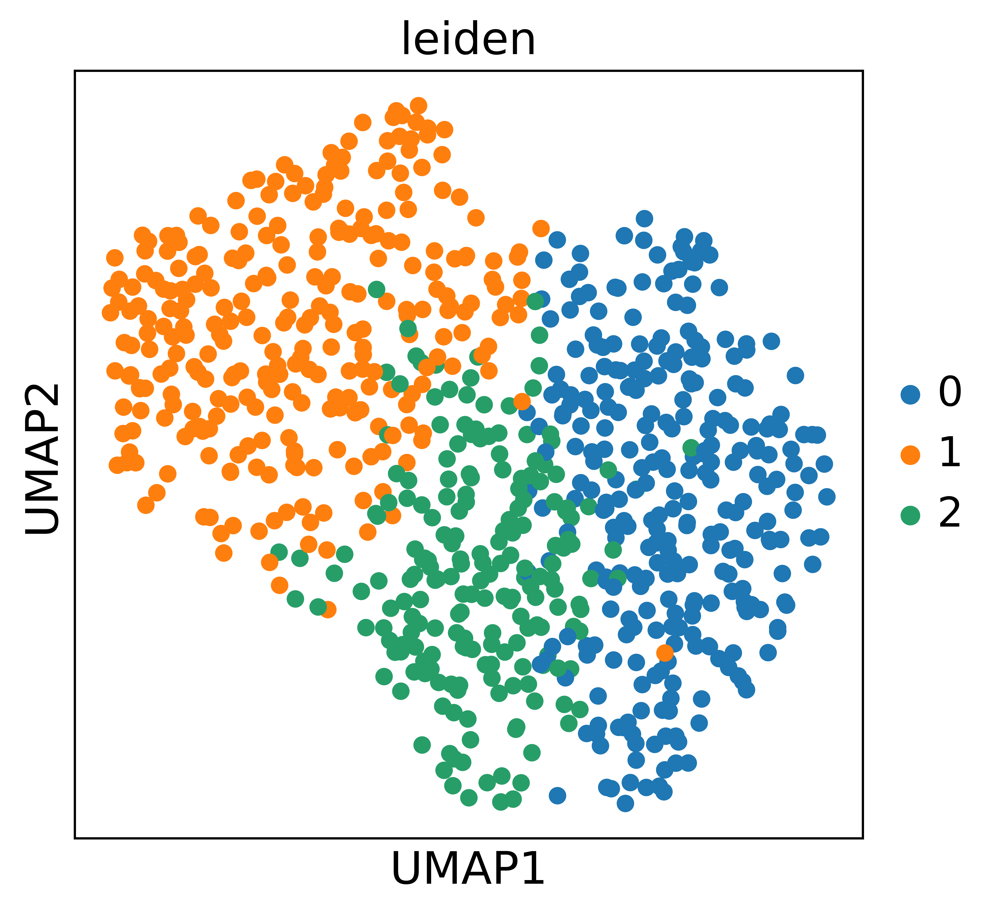

In [35]:
sc.pl.umap(sub_adata, color='leiden')

In [36]:
mapping_subclusters = {
    '0': "Ambiguous_1",
    '1': "Ambiguous_2",
    '2': "Ambiguous_3",
}

In [37]:
celltype_fineres[adata.obs["celltype"]==celltype_to_subcluster] = [mapping_subclusters[i] for i in sub_adata.obs['leiden']]

In [38]:
# set final cell types
adata.obs['celltype'] = celltype_fineres

## Save raw and normalized anndata objects with annotations

In [39]:
# re-orient
adata.obsm["spatial"][:,1] = -adata.obsm["spatial"][:,1]
adata.obs["center_y"] = -adata.obs["center_y"]
adata.obs["min_y"] = -adata.obs["min_y"]
adata.obs["max_y"] = -adata.obs["max_y"]

In [40]:
adata.write_h5ad("svz_anndata/annotated_pilot_svz_cropped_normalized.h5ad")

In [41]:
raw_adata = sc.read_h5ad("svz_anndata/pilot_svz_cropped_raw.h5ad")

/home/edsun/anaconda3/envs/merfish/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [42]:
# save raw counts too
raw_adata.obs = adata.obs
raw_adata.var = adata.var
raw_adata.obsm = adata.obsm
raw_adata.varm = adata.varm
raw_adata.obsp = adata.obsp
raw_adata.varp = adata.varp
raw_adata.uns = adata.uns

raw_adata.write_h5ad("svz_anndata/annotated_pilot_svz_cropped_raw.h5ad")

## Save cropped anndatas to just the ambiguous cluster

In [43]:
sub_adata = adata[adata.obs['celltype'].isin(['Ambiguous_1',
                                              'Ambiguous_2',
                                              'Ambiguous_3'])].copy()
sub_adata.write_h5ad("svz_anndata/annotated_pilot_svz_cropped_normalized_subset.h5ad")

In [44]:
sub_raw_adata = raw_adata[raw_adata.obs['celltype'].isin(['Ambiguous_1',
                                                          'Ambiguous_2',
                                                          'Ambiguous_3'])].copy()
sub_raw_adata.write_h5ad("svz_anndata/annotated_pilot_svz_cropped_raw_subset.h5ad")

# Get list of NSC lineage cell type markers for imputation

In [45]:
Astrocyte_markers = ['Aqp4','Aldh1l1']
qNSC_aNSC_markers = ['Prom1','Slc1a3','Nr2e1','Sox9','Vcam1','Hes5',
                     'Thbs4','Gja1']
aNSC_NPC_markers = ['Pclaf', 'H2afx', 'Rrm2', 'Insm1', 'Egfr',
                    'Mcm2', 'Cdk1']
Neuroblast_markers = ['Stmn2', 'Dlx6os1', 'Igfbpl1', 'Sox11','Dlx1']

new_markers = Astrocyte_markers+qNSC_aNSC_markers+aNSC_NPC_markers+Neuroblast_markers

In [46]:
for gene in new_markers:
    if gene in adata.var_names:
        print(gene)

In [47]:
with open('svz_anndata/lineage_marker_genes.txt', 'w') as f:
    for line in new_markers:
        f.write(f"{line.lower()}\n")

# Process Buckley et al. (2023) scRNAseq dataset of the SVZ

We use the following R commands in Seurat to extract the text files for TISSUE input from the Seurat object.

library(Seurat)
library(tidyverse)

sdata <- readRDS("multi_intergrated_seurat_Dec2020.rds")

write.table(as.matrix(GetAssayData(object = sdata, slot = "counts")), 
            'scRNA_count.txt', 
            sep = '\t', row.names = T, col.names = T, quote = F)

## Convert all data to DataUpload format

In [48]:
def convert_adata_to_dataupload (adata, savedir):
    
    locations = pd.DataFrame(adata.obsm['spatial'], columns=['x','y'])
    locations.to_csv(os.path.join(savedir,"Locations.txt"), sep="\t", index=False)
    
    df = pd.DataFrame(adata.X, columns=adata.var_names)
    df.to_csv(os.path.join(savedir,"Spatial_count.txt"), sep="\t", index=False)
    
    meta = pd.DataFrame(adata.obs)
    meta.to_csv(os.path.join(savedir,"Metadata.txt"))

In [49]:
raw_adata = sc.read_h5ad("svz_anndata/annotated_pilot_svz_cropped_raw.h5ad")
sub_raw_adata = sc.read_h5ad("svz_anndata/annotated_pilot_svz_cropped_raw_subset.h5ad")

/home/edsun/anaconda3/envs/merfish/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [50]:
# Add in left and right labels
raw_adata.obs["ventricle"] = ["left" if x<0 else "right" for x in raw_adata.obs["center_x"]]
sub_raw_adata.obs["ventricle"] = ["left" if x<0 else "right" for x in sub_raw_adata.obs["center_x"]]

In [51]:
# Add in dorsal and ventral labels
ylow = 400
yhigh = 750

raw_adata.obs["region"] = ["dorsal" if (y>yhigh) else "ventral" if (y<ylow) else "middle" for y in raw_adata.obs["center_y"]]
sub_raw_adata.obs["region"] = ["dorsal" if (y>yhigh) else "ventral" if (y<ylow) else "middle" for y in sub_raw_adata.obs["center_y"]]

In [52]:
# save final objects in GeneImputation folder
raw_adata.write_h5ad("svz_anndata/raw_svz_all.h5ad")
sub_raw_adata.write_h5ad("svz_anndata/raw_svz_sub.h5ad")

In [18]:
convert_adata_to_dataupload (raw_adata, "../../GeneImputationTISSUE/svz_anndata/SVZ")

In [19]:
convert_adata_to_dataupload (sub_raw_adata, "../../GeneImputationTISSUE/svz_anndata/SVZsubambiguous")

### Identified labels from TISSUE

In [22]:
raw_adata = sc.read_h5ad("../../GeneImputationTISSUE/svz_anndata/raw_svz_all.h5ad")
sub_raw_adata = sc.read_h5ad("../../GeneImputationTISSUE/svz_anndata/raw_svz_sub.h5ad")

In [27]:
lineage_mapper = {"Ambiguous_1": "Neuroblast",
                  "Ambiguous_2": "aNSC/NPC",
                  "Ambiguous_3": "qNSC",}

raw_adata.obs["celltype"] = raw_adata.obs["celltype"].replace(lineage_mapper)
sub_raw_adata.obs["celltype"] = sub_raw_adata.obs["celltype"].replace(lineage_mapper)

In [30]:
convert_adata_to_dataupload (raw_adata, "svz_anndata/SVZlabeled")
convert_adata_to_dataupload (sub_raw_adata, "svz_anndata/SVZsubambiguouslabeled")